In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
from tensorflow import keras

#tensorboard
%load_ext tensorboard
import datetime, os

# AutoEncoders

Los *Autoencoders* (AE) (o autocodificadores) son redes neuronales artificiales capaces de aprender representaciones densas de la entrada, llamada representación latente. Tienen varias aplicaciones, como por ejemplo:
* **Reducción de dimensionalidad**: El espacio latentes es, naturalmente, una representación de menor dimensionalidad del espacio original, estas proyecciones son mucho más interesantes que, por ejemplo, PCA y se puede utilizar junto con **t-SNE** para mejorar la visualización de similaridades en un espacio 2-Dimensional.
* **Detección de variables**: Se puede usar para seleccionar features.
* **Detección de Anomalías**: Al entrenar un AE se aprende la distribución de  los datos de entrada, si al presentarle un nuevo dato el error en la reconstrucción es muy grande o su representación en el espacio latente está muy alejada de las demás puede indicar que el dato en cuestión "no es como los otros" por lo que seria un valor atípico, una anomalia.
* **Generación de datos**: Algunos AE, en particular *Variational Autoencoders* o VAEs, son *modelos generativos* y se puede usar la parte del *decoder* para generar datos NUEVOS que caen dentro de la distribución original de los datos con los que se entrenó (ejemplo: This Person Does Not Exist).
* **Limpieza de datos**: Se puede entrenar el AE con datos ruidosos y que aprenda a reconstruir los datos originales.

Logran todo esto simplemente aprendiendo a reproducir la entrada en la salida, con la condición de que las capas intermedias tengan dimensionalidad baja (cuello de botella). De esta manera se obliga a la red a comprimir la información de la distribución y encontrar representaciones eficientes.

Vamos a ver distintas versiones de AutoEncoders, empezando por la más simple. Esta notebook es una adaptación de [este artículo on el blog de keras](https://blog.keras.io/building-autoencoders-in-keras.html).

### El AE más simple

Como ya mencionamos un AE es una red neuronal cuyas capa inicial y final tienen la misma cantidad de neuronas y su capa intermedia tiene una cantidad mucho menor. El entrenamiento se hace de una manera auto-supervisada, la red aprende a reproducir la entrada original.

Reproducir el input implica que el algoritmo aprendió a codificar los datos en una representación latente (encoder), a decodificar esta representación latente y a obtener los features (decoder). El objetivo es lograr esto con una pérdida mínima de información.

El AE más simple tiene una única capa oculta. Utilicemos este AE para codificar el dataset de MNIST a un vector de dimensión 32.

In [2]:
keras.backend.clear_session()

# tamaño de la representación interna.
encoding_dim = 32  # 32 flotantes -> un factor de compresión de 24.5

#input placeholder
input_img = keras.layers.Input(shape=(784,))

In [3]:
#codificación
encoded = keras.layers.Dense(encoding_dim, activation='relu')(input_img)

#salida: Usamos una sigmoides porque los pixeles van de 0 a 1.
decoded = keras.layers.Dense(784, activation='sigmoid')(encoded)


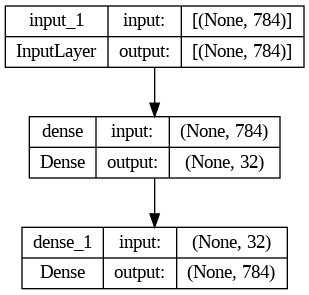

In [4]:
#El modelo se instancia como:
autoencoder = keras.models.Model(input_img, decoded)

keras.utils.plot_model(autoencoder, show_shapes=True)


De aquí podemos sacar dos sub-redes.
El codificador:

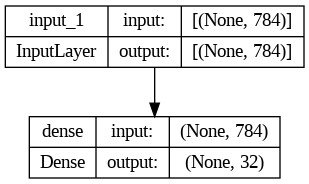

In [6]:
encoder = keras.models.Model(input_img, encoded)
keras.utils.plot_model(encoder, show_shapes=True)

Y el decodificador:

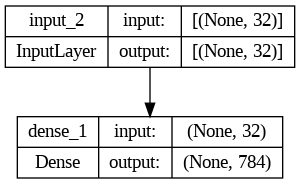

In [7]:
# Se define uin placeholder de entrada auxiliar:
encoded_input = keras.layers.Input(shape=(encoding_dim,))

#Esto retorna el último layer
decoder_layer = autoencoder.layers[-1]

#Y instanciamos la nueva capa aplicando sobre la entrada codificada
decoder = keras.models.Model(encoded_input, decoder_layer(encoded_input))

keras.utils.plot_model(decoder, show_shapes=True)

In [8]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 784)]             0         
                                                                 
 dense (Dense)               (None, 32)                25120     
                                                                 
 dense_1 (Dense)             (None, 784)               25872     
                                                                 
Total params: 50992 (199.19 KB)
Trainable params: 50992 (199.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Antes de compilar, necesitamos definir la función de pérdida. Podríamos tratar esto como un problema de regresión pixel a pixel. Sin embargo, como tenemos 784 números entre 0 y 1, conviene pensar que tenemos 784 problemas binarios de clasificación y utilizar entropía cruzada.

In [9]:
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

Veamos como funciona en MNIST:

In [10]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

#normalize to [0,1]
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
#And flatten to a 784-dimensional vector
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print (x_train.shape)
print (x_test.shape)

11490434/11490434 [==============================] - 0s 0us/step
(60000, 784)
(10000, 784)


Entrenamos...

In [11]:
early_stopping_cb=keras.callbacks.EarlyStopping(patience=10,restore_best_weights=True)

history = autoencoder.fit(x_train, x_train,
                          epochs=50,
                          batch_size=256, #estoy poniendo un batch_size alto solo para que corra más rápido, recuerden lo que dijo Yann LeCun ( https://twitter.com/ylecun/status/989610208497360896?lang=es )
                          shuffle=True,
                          validation_data=(x_test, x_test),
                          callbacks=[early_stopping_cb]
                         )

Epoch 1/50
235/235 [==============================] - 7s 6ms/step - loss: 0.2743 - val_loss: 0.1885
Epoch 2/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1704 - val_loss: 0.1538
Epoch 3/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1449 - val_loss: 0.1344
Epoch 4/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1294 - val_loss: 0.1221
Epoch 5/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1190 - val_loss: 0.1134
Epoch 6/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1118 - val_loss: 0.1077
Epoch 7/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1068 - val_loss: 0.1036
Epoch 8/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1032 - val_loss: 0.1005
Epoch 9/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1005 - val_loss: 0.0982
Epoch 10/50
235/235 [==============================] - 1s 4ms/step - loss: 0.0984 - val_loss: 0.0963

Con la red ajustada, podemos codificar y decodificar las imagenes de 28x28:

In [12]:
#Codificar:
encoded_imgs = encoder.predict(x_test)
#Decodificar: (todo esto es análogo a autoencoder.predict(x_test))
decoded_imgs = decoder.predict(encoded_imgs)

313/313 [==============================] - 0s 1ms/step


Visualicemos algunas de estas imágenes junto con sus espacios latentes

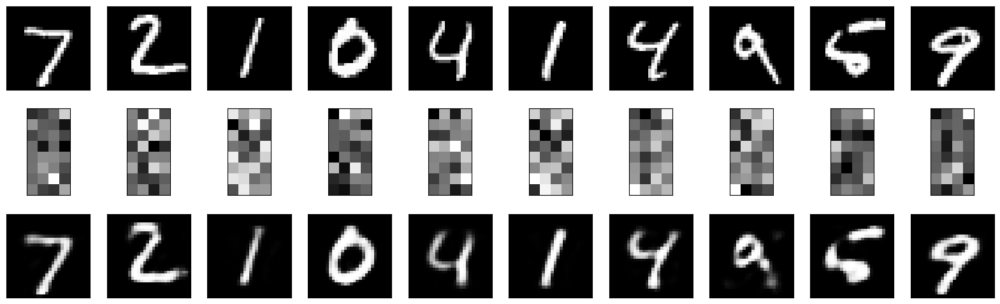

In [13]:
n = 10  # cuantos digitos imprimimos
plt.figure(figsize=(20, 6))
for i in range(n):
    # original
    ax = plt.subplot(3, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # espacio latente
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(encoded_imgs[i].reshape(8, 4))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # reconstrucción
    ax = plt.subplot(3, n, i + 1 + 2*n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

miremos el _RMSE de Reconstrucción_:

In [20]:
rmse_ae = np.mean((decoded_imgs-x_test)**2)
print(f"Reconstruction RMSE: {rmse_ae}")

Reconstruction RMSE: 0.0044831782579422


## Deep AE


Por supuesto, la idea se puede generalizar haciendo arquitecturas más profundas. Esto se suele llamar *Stacked Autoencoders*. La idea es que añadir más capas permite aprender codificaciones más complejas.

En general, la arquitectura de un *stacked autoencoder* es simétrica con respecto a la capa oculta central (la capa codificadora). Pueden visualizar un sambuche.



![AutoEncoder from Wikipedia](https://upload.wikimedia.org/wikipedia/commons/2/28/Autoencoder_structure.png)

**Ojo:** Hay que ser cuidadoso y no hacer al AE demasiado poderoso. Puede pasar que el AE aprenda una codificación única para cada dato. Esto implica que la representación de los datos no es útil y que probablemente generalice pésimo.

Armemos uno para MNIST:

In [14]:
keras.backend.clear_session()

In [15]:
input_img = keras.layers.Input(shape=(784,))
encoded = keras.layers.Dense(128, activation='relu')(input_img)
encoded = keras.layers.Dense(64, activation='relu')(encoded)
encoded = keras.layers.Dense(49, activation='relu')(encoded)

decoded = keras.layers.Dense(49, activation='relu')(encoded)
decoded = keras.layers.Dense(128, activation='relu')(decoded)
decoded = keras.layers.Dense(784, activation='sigmoid')(decoded)

deep_autoencoder = keras.models.Model(input_img, decoded)

deep_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

deep_autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 784)]             0         
                                                                 
 dense (Dense)               (None, 128)               100480    
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 49)                3185      
                                                                 
 dense_3 (Dense)             (None, 49)                2450      
                                                                 
 dense_4 (Dense)             (None, 128)               6400      
                                                                 
 dense_5 (Dense)             (None, 784)               101136

Ajustemoslo con un EarlyStopping callback y usemos tensorboard (recuerden el tema de las cookies de terceros y demás...):

In [16]:
#tensorboard initialization
logdir = os.path.join("logs", "AE", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [17]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)

history = deep_autoencoder.fit(x_train, x_train,
                               epochs=100,
                               batch_size=32, #lo mismo de antes!
                               shuffle=True,
                               validation_data=(x_test, x_test),
                               callbacks=[early_stopping_cb, tensorboard_callback],
                               )

Epoch 1/100
1875/1875 [==============================] - 10s 4ms/step - loss: 0.1494 - val_loss: 0.1124
Epoch 2/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.1066 - val_loss: 0.1000
Epoch 3/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0980 - val_loss: 0.0943
Epoch 4/100
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0936 - val_loss: 0.0906
Epoch 5/100
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0907 - val_loss: 0.0889
Epoch 6/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0886 - val_loss: 0.0869
Epoch 7/100
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0870 - val_loss: 0.0854
Epoch 8/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0858 - val_loss: 0.0845
Epoch 9/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0848 - val_loss: 0.0835
Epoch 10/100
1875/1875 [==============================] - 7s 4ms/step - 

veamos las imagenes resultantes...

313/313 [==============================] - 1s 2ms/step


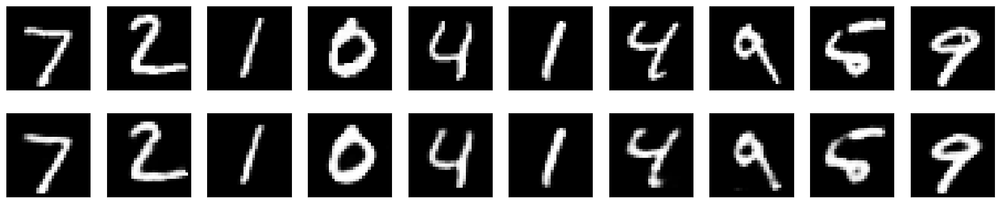

In [18]:
decoded_imgs = deep_autoencoder.predict(x_test)

n = 10  # cuantos digitos vamos a mostrar
plt.figure(figsize=(20, 4))
for i in range(n):
    # muesta el original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Muestra la reconstrucción
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

Veamos el _RMSE de reconstucción_:

In [19]:
rmse_dae = np.mean((decoded_imgs-x_test)**2)
print(f"Reconstruction RMSE: {rmse_dae}")

Reconstruction RMSE: 0.0044831782579422


## AutoEncoder Convolucional:

Como estas son imágenes sería mejor usar una arquitectura que mantenga esa estructura. Como se mencionó en las diapositivas tenemos que introducir un nuevo tipo de capa de upsampling.



In [21]:
keras.backend.clear_session()

In [ ]:
# V1, una versión posible
"""
input_img = keras.layers.Input(shape=(28, 28, 1))

#Encoder: Conv -> MaxPool (x2)
x = keras.layers.Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same')(input_img)
x = keras.layers.Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
encoded = keras.layers.Conv2D(1, (3, 3), activation='relu', padding='same')(x)

#The latent-representation has shape (7, 7, 1) i.e. 49-dimensional

#Decoder: Conv2D -> Conv2DTranspose (x3)
x = keras.layers.Conv2DTranspose(32, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded)
x = keras.layers.Conv2DTranspose(32, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = keras.layers.Conv2DTranspose(1, (3, 3), activation='sigmoid', padding='same')(x)

conv_autoencoder = keras.models.Model(input_img, decoded)
conv_autoencoder.compile(loss='binary_crossentropy', optimizer='adam')
"""

In [23]:
import keras
from keras import layers

input_img = keras.Input(shape=(28, 28, 1))

x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(16, (3, 3), activation='relu')(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

conv_autoencoder = keras.Model(input_img, decoded)
conv_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

In [24]:
conv_autoencoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 14, 14, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 14, 14, 8)         1160      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 7, 7, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 7, 7, 8)           584 

Importemos el dataset de nuevo para tenerlo en su estado original.

In [25]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

# Normalizamos
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.

# Rescaleamos para tener forma de imagen
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))


In [26]:
logdir = os.path.join("logs", "convAE") #para diferenciar los logs
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)

hist = conv_autoencoder.fit(x_train, x_train,
                            epochs=100,
                            batch_size=128,
                            shuffle=True,
                            validation_data=(x_test, x_test),
                            callbacks=[early_stopping_cb, tensorboard_callback],
                            verbose=False, #apago la salida porque sino después es un bardo scrollear hasta tensorboard...
                            )

In [27]:
#podemos salvar el modelo entrenado
conv_autoencoder.save('convAE.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [29]:
#podemos salvar el modelo entrenado con el nuevo formato keras
conv_autoencoder.save('convAE.keras')

313/313 [==============================] - 1s 3ms/step


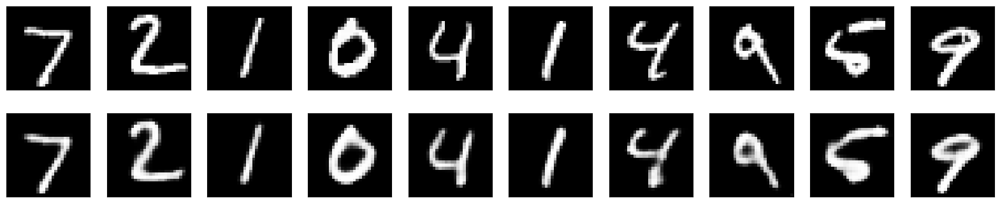

In [30]:
decoded_imgs = conv_autoencoder.predict(x_test)

n = 10  # how many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].squeeze())
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

### Representaciones latentes

También podemos visualizar las representaciones latentes, ojo no significa que podamos interpretarlas como imágenes

313/313 [==============================] - 1s 1ms/step


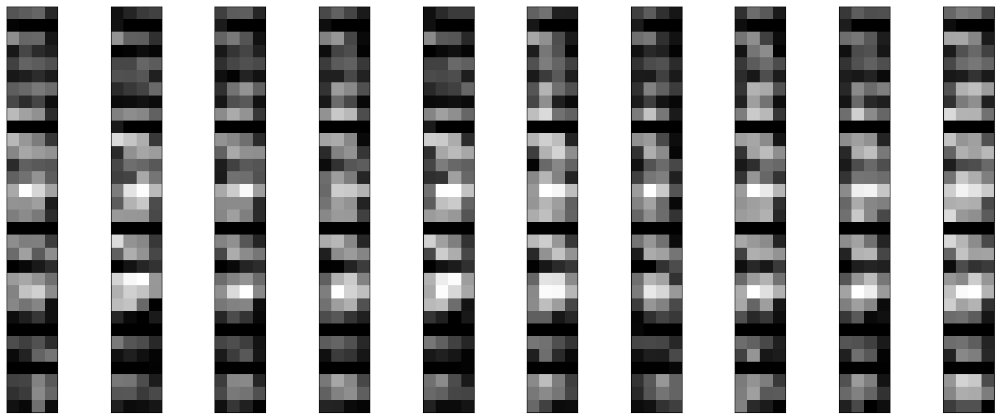

In [31]:
conv_encoder = keras.Model(input_img, encoded)
encoded_imgs = conv_encoder.predict(x_test)

n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i].reshape((4, 4 * 8)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

### Reducción de ruido

Como vimos en las diapos, una posible aplicación de los AEs es que se pueden utilizar para "limpiar" los datos. Cualquier ruido que no siga los patrones del conjunto de entrenamiento será "limpiado" al pasar a través del AE. Veamoslo con nuestro AE convolucional agregando un poco de ruido.

In [32]:
#Agregamos ruido gaussiano a nuestras imágenes
noise_factor = 0.2
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)

#Nos aseguramos de que los pixeles estén en el rango [0,1] utilizando saturación.
x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

Estas son las imagenes ruidosas generadas.

Original


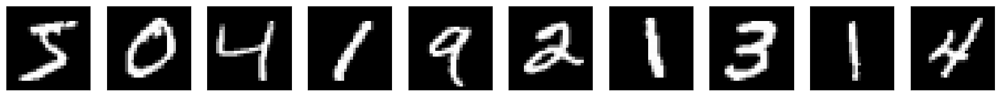

Noisy


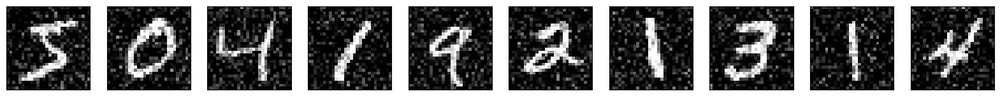

In [33]:
n = 10
plt.figure(figsize=(20, 2))
print("Original")
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_train[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()
print("Noisy")
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_train_noisy[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

Ahora ajustemos el autoencoder usando las imagenes ruidosas como entrada y las imágenes limpias como salida:

In [34]:
logdir = os.path.join("logs", "noisyAE")#datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=5,
                                                  restore_best_weights=True)

In [35]:
conv_autoencoder.fit(x_train_noisy, x_train,
                   epochs=100,
                    batch_size=256,
                    shuffle=True,
                    validation_data=(x_test_noisy, x_test),
                    callbacks=[tensorboard_callback, early_stopping_cb],
                    verbose=False,
                     )


Y veamos como las limpia el AE...

In [36]:
x_test_cleaned = conv_autoencoder.predict(x_test_noisy)

313/313 [==============================] - 1s 2ms/step


Original


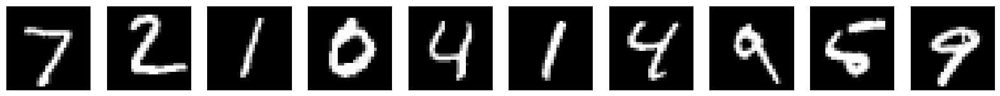

Noisy


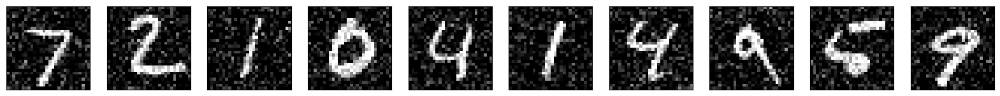

Clean


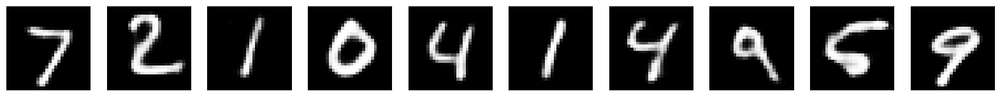

In [37]:
n = 10

print("Original")
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

print("Noisy")
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_noisy[i].squeeze())
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

plt.figure(figsize=(20, 2))
print("Clean")
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_cleaned[i].squeeze())
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

Podemos aplicar el AE muchas veces para tratar de sacar más ruido. Sin embargo, esto puede magnificar cualquier distorsión que tenga el AE.

313/313 [==============================] - 1s 2ms/step
Clean


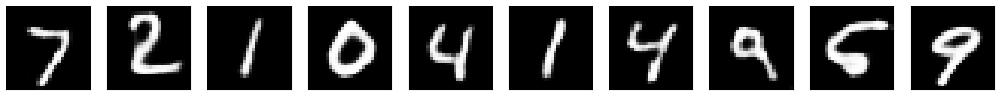

In [38]:
#Iteremos
x_test_cleaned = conv_autoencoder.predict(x_test_cleaned)

#And visualize
plt.figure(figsize=(20, 2))
print("Clean")
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_cleaned[i].squeeze())
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## Denoising AutoEncoders:

El forzar a los AE a aprender de datos ruidosos es otra forma de restricción que puede ayudar a aprender características útiles. Esta idea fue implementada en un [paper de 2010](https://jmlr.csail.mit.edu/papers/v11/vincent10a).

El ruido puede agregarse como ruido normal o puede implementarse añadiendo una capa de Dropout que apague algunos pixeles (que pueden jugar el rol de, por ejemplo, pixeles muertos en una CCD).

Veamos:

In [39]:
keras.backend.clear_session()

dropout_encoder = keras.models.Sequential([
    keras.layers.Dropout(0.2, input_shape=(28,28,1)),
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2), padding='same'),
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2), padding='same')
])

dropout_decoder = keras.models.Sequential([
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.UpSampling2D((2, 2)),
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.UpSampling2D((2, 2)),
    keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')
])

dropout_autoencoder = keras.models.Sequential([dropout_encoder, dropout_decoder])

dropout_autoencoder.compile(loss='binary_crossentropy')


In [40]:
logdir = os.path.join("logs_ae", "denoisingAE")#datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=5,
                                                  restore_best_weights=True)

hist = dropout_autoencoder.fit(x_train, x_train,
                            epochs=100,
                            batch_size=256,
                            shuffle=True,
                            validation_data=(x_test, x_test),
                            callbacks=[early_stopping_cb, tensorboard_callback],
                            verbose=False
                               )

Veamos como funciona.

In [41]:
x_test_cleaned_do = dropout_autoencoder.predict(x_test_noisy)

313/313 [==============================] - 1s 2ms/step


Original


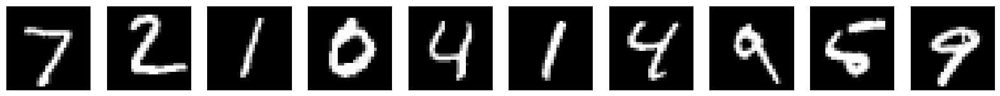

Ruidoso


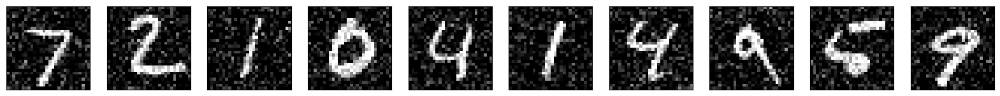

limpio (sin DropOut)


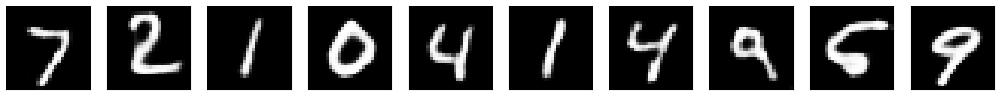

limpio (con DropOut)


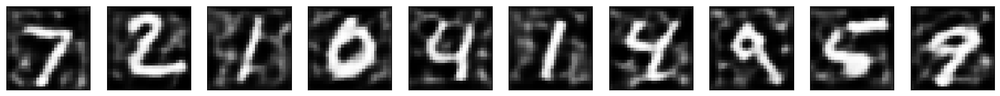

In [42]:
n = 10

print("Original")
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

print("Ruidoso")
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

plt.figure(figsize=(20, 2))
print("limpio (sin DropOut)")
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_cleaned[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

plt.figure(figsize=(20, 2))
print("limpio (con DropOut)")
for i in range(n):
    ax = plt.subplot(1, n, i+1)
    plt.imshow(x_test_cleaned_do[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

Y comparamos la pérdida de reconstrucción con la anterior

In [43]:
dropout_autoencoder.evaluate(x_test, x_test_noisy)

313/313 [==============================] - 1s 3ms/step - loss: 0.9887


0.9887478351593018

In [44]:
conv_autoencoder.evaluate(x_test, x_test_noisy)

313/313 [==============================] - 1s 3ms/step - loss: 0.9715


0.9715079069137573

# AutoEncoder Variacional (VAE)

In [45]:
keras.backend.clear_session()

Una categoría importante de *autoencoders* fue introducida en este [trabajo de 2013 ](https://arxiv.org/abs/1312.6114), el AE Variacional.

Difieren en que:
* Son *autoencoders probabilisticos*: Los outputs son parcialmente determinados por el azar incluso en la etapa de inferencia (en los denoising AEs la limpieza era determinista).
* Son *generativos*: **Pueden generar nuevas instancias de datos que parecen haber sido sampleados del dataset de entrenamiento.**
* Pueden ser entrenados para realizar Inferencia Bayesiana Variacional, una manera veloz de realizar inferencia Bayesiana aproximada.

La idea es la siguiente: en vez de mapear instancias de entrenamiento a un vector latente de baja dimensionalidad (que a su vez es mapeado de manera determinista de vuelta al espacio original), **vamos a mapear las instancias de entrenamiento a distribuciones de probabilidad de codeos**. El decoder toma estas distribuciones y genera los datos.

Por ejemplo, en lugar de aprender una codificación para un dado input, el encoder aprende una media de codificación $\mu$ y una desviación estándar $\sigma$ de codificación. La codificación se samplea al azar de una distribución normal con media $\mu$ y desviación estándar $\sigma$. Tras samplear, el decoder decodifica como antes.


Un autoencoder variacional tiende a producir codificaciones
que parecen extraídas de una distribución gaussiana simple: la función de costo se modifica, agregando un término que empuja a las codificaciones a parecerse a una nube de puntos gaussianos. Una gran consecuencia es que, tras entrenar un AE variacional es muy sencillo generar una nueva instancia: basta con muestrear una codificación aleatoria de la gaussiana, descodificarla y ¡voilá!

Construyamos este ejemplo. Vamos a necesitar guardar las dimensiones de las instancias de entrenamiento.



In [47]:
# MNIST dataset
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

# variables útiles
image_size = x_train.shape[1]

original_dim = image_size * image_size

# Normalización
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

Ahora definamos los parametros de la red. Vamos a utilizar dos codificadores dos-dimensionales (en total, cuatro) y aprenderemos una distribución bi-normal para nuestra codificación.

In [48]:
keras.backend.clear_session()

# parametros de red
input_shape = (image_size, image_size, )
intermediate_dim = 512
batch_size = 128
latent_dim = 2
epochs = 50

### Capa de muestreo

Para implementar un VAE con muestreo gaussiano, necesitamos **definir** una capa de keras que muestrea de dos gaussianas. Esto no esta incluido en keras asi que hay que definirlo a mano.

In [49]:
K = keras.backend

class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean

Esta capa toma dos entradas, la media $\mu$ de la distribución normal, y los logaritmos de las varianzas $\log \sigma^2$ qué es mas eficiente que aprender la varianza.

### Codificador:

Con la capa de muestreo construimos el codificador. Cómo el modelo no es puramente secuencial se usa la API funcional:

Model: "variational_encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 encoder_input (InputLayer)  [(None, 28, 28)]             0         []                            
                                                                                                  
 flatten (Flatten)           (None, 784)                  0         ['encoder_input[0][0]']       
                                                                                                  
 dense (Dense)               (None, 512)                  401920    ['flatten[0][0]']             
                                                                                                  
 z_mean (Dense)              (None, 2)                    1026      ['dense[0][0]']               
                                                                                

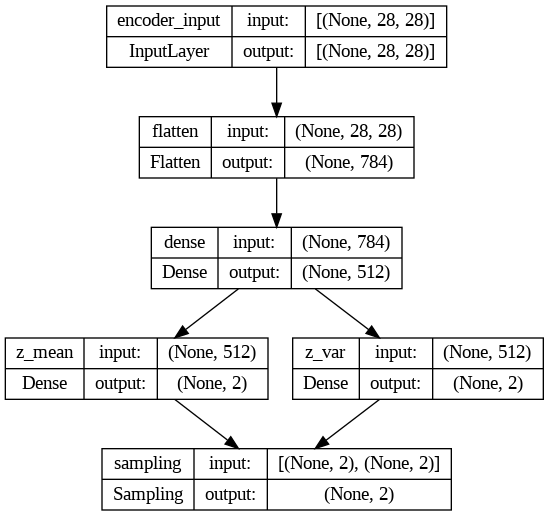

In [50]:
inputs = keras.layers.Input(shape=input_shape, name='encoder_input')
x = keras.layers.Flatten()(inputs)

# Capa densa oculta
x = keras.layers.Dense(intermediate_dim, activation='relu')(x)

# Capa donde se codifican cuatro parámetros (dos para cada Gaussiana)
z_mean = keras.layers.Dense(latent_dim, name='z_mean')(x)
z_logvar = keras.layers.Dense(latent_dim, name='z_var')(x)

# Capa de sampleo
z = Sampling()([z_mean, z_logvar])

variational_encoder = keras.models.Model(inputs = [inputs],
                                         outputs=[z_mean, z_logvar, z],
                                         name='variational_encoder')
variational_encoder.summary()

keras.utils.plot_model(variational_encoder, show_shapes=True)

### Decodificador

La última parte el decodificador, es una arquitectura secuencial como las que vimos antes.

Model: "variational_decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 2)]               0         
                                                                 
 dense_3 (Dense)             (None, 512)               1536      
                                                                 
 dense_4 (Dense)             (None, 784)               402192    
                                                                 
 reshape_1 (Reshape)         (None, 28, 28)            0         
                                                                 
Total params: 403728 (1.54 MB)
Trainable params: 403728 (1.54 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


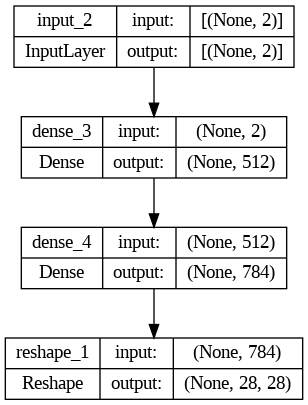

In [52]:
# Variational decoder
latent_inputs = keras.layers.Input(shape=(latent_dim,))
x = keras.layers.Dense(intermediate_dim, activation='relu')(latent_inputs)

# Uso una función sigmoide para la activación de la última capa para asegurarme de tener pixeles en [0,1]
x = keras.layers.Dense(original_dim, activation='sigmoid')(x)
outputs = keras.layers.Reshape(input_shape)(x)

# instanceo el modelo del decoder
variational_decoder = keras.models.Model(inputs=[latent_inputs], outputs=[outputs], name='variational_decoder')
variational_decoder.summary()
keras.utils.plot_model(variational_decoder, show_shapes=True)

### Modelo Completo

Juntamos todo:

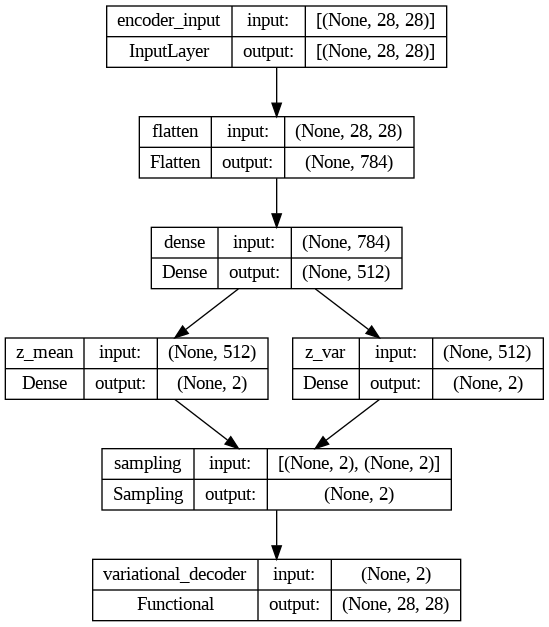

In [53]:
#el decoder es el modelo
#z es la variable definida como el tercer output del encoder
outputs = variational_decoder(z)

#autoencoder:
vae = keras.models.Model(inputs, outputs, name='vae_mlp')
keras.utils.plot_model(vae, show_shapes=True)

### Compilación y entrenamiento

Diferente a lo que haciamos antes ahora queremos que el codificador genere puntos con distribución normal. Para esto además de la *pérdida de reconstrucción* (la entropía cruzada), necesitamos una **pérdida en el espacio latente** . Esta es la divergencia de Kullback–Leibler entre la distibución normal objetivo, y la distribución actual de codificaciones. Es básicamente una distancia entre distribuciones que tiene la siguiente forma.

In [54]:
# Latent loss, calculada para cada instancia, sumando sobre las
# dimensiones del espacio latente (axis=-1)
latent_loss = -0.5 * K.sum(
    1 + z_logvar - K.exp(z_logvar) - K.square(z_mean),
    axis=-1)

# Se le suma la media de la latent loss para cada
# instancia a las pérdida.
# Se vuelve a dividir por la cantidad de pixeles de
# la imagen para equilibrar el peso de las dos pérdidas
# (ver Géron P.589)
vae.add_loss(K.mean(latent_loss) / image_size**2 )
vae.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [55]:
logdir = os.path.join("logs", "VAE", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)

hist = vae.fit(x_train, x_train,
        shuffle=True,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(x_test, x_test),
        callbacks = [early_stopping_cb, tensorboard_callback]
               )

Epoch 1/50
469/469 [==============================] - 6s 9ms/step - loss: 0.2875 - val_loss: 0.2491
Epoch 2/50
469/469 [==============================] - 2s 5ms/step - loss: 0.2458 - val_loss: 0.2423
Epoch 3/50
469/469 [==============================] - 2s 5ms/step - loss: 0.2407 - val_loss: 0.2375
Epoch 4/50
469/469 [==============================] - 3s 5ms/step - loss: 0.2362 - val_loss: 0.2333
Epoch 5/50
469/469 [==============================] - 3s 7ms/step - loss: 0.2324 - val_loss: 0.2297
Epoch 6/50
469/469 [==============================] - 2s 5ms/step - loss: 0.2296 - val_loss: 0.2274
Epoch 7/50
469/469 [==============================] - 2s 5ms/step - loss: 0.2275 - val_loss: 0.2257
Epoch 8/50
469/469 [==============================] - 3s 6ms/step - loss: 0.2259 - val_loss: 0.2242
Epoch 9/50
469/469 [==============================] - 3s 6ms/step - loss: 0.2246 - val_loss: 0.2232
Epoch 10/50
469/469 [==============================] - 3s 6ms/step - loss: 0.2235 - val_loss: 0.2222

### Visualización:

Grafiquemos las reconstrucciones!

1/1 [==============================] - 0s 134ms/step


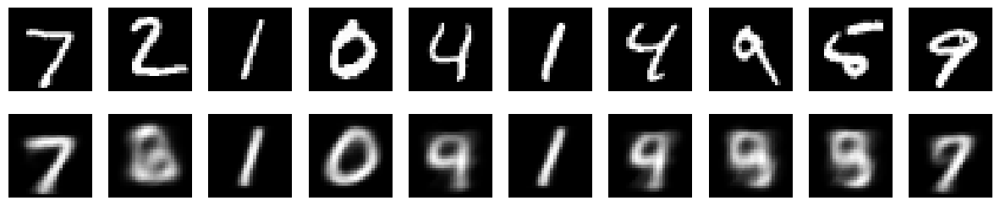

In [56]:
def plot_image(image):
    plt.imshow(image)
    plt.axis("off")

def show_reconstructions(model, images=x_test, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

show_reconstructions(vae, n_images=10)

Veamos las codificaciones en test:

In [57]:
z_mean, z_var, z = variational_encoder.predict(x_test, batch_size=batch_size)


79/79 [==============================] - 0s 2ms/step


Dado que la codificación es 2-dimensional, podemos visualizar como están distribuidas (vamos a mostrar solo la media de las gausianas)

<ipython-input-58-d33267144063>:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(z_mean[i, 0], z_mean[i, 1], c='C'+str(number), cmap='rainbow', label=number,


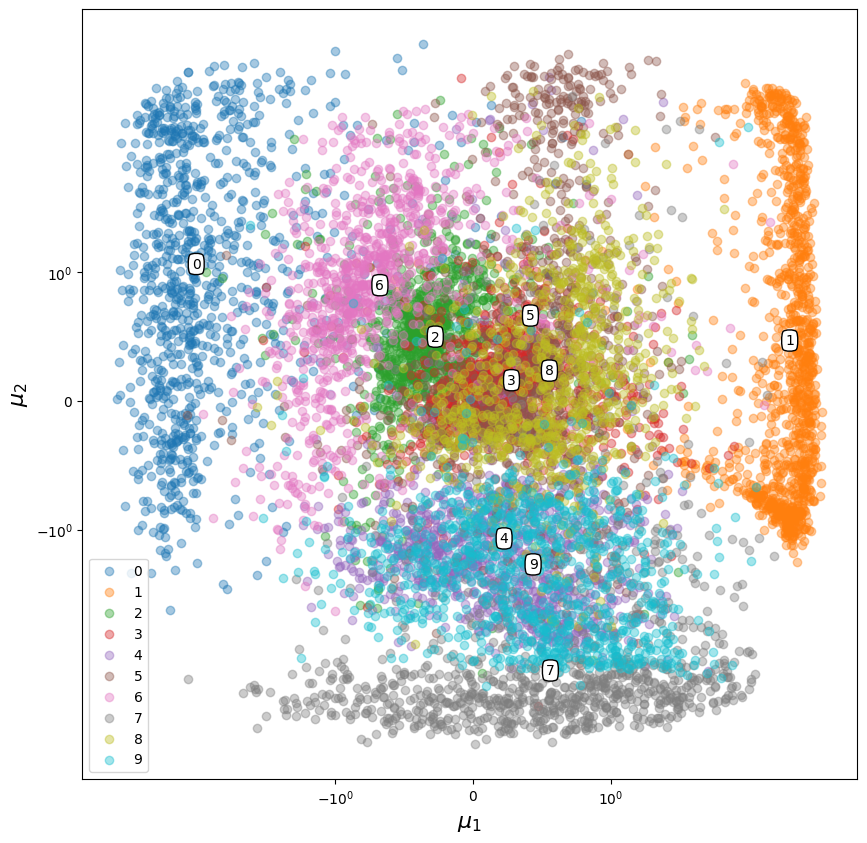

In [58]:
#Visualization
plt.figure(figsize=(10, 10))

for number in range(10):
    i = y_test == number
    # Plot instances of these numbers
    # plt.scatter(mu_test[i, 0], mu_test[i, 1], c='C'+str(number), cmap='rainbow', label=number,
    #                alpha=0.4)
    plt.scatter(z_mean[i, 0], z_mean[i, 1], c='C'+str(number), cmap='rainbow', label=number,
                alpha=0.4)
    plt.annotate(str(number), (z_mean[i, 0].mean(), z_mean[i, 1].mean()),
                 bbox=dict(boxstyle="round4", fc="w", ec="k", lw=1))

# plt.colorbar()
plt.xscale('symlog')
plt.yscale('symlog')

# Labels
plt.xlabel('$\mu_1$', fontsize=16)
plt.ylabel('$\mu_2$', fontsize=16)
plt.legend()
plt.show()

¡El espacio latente es mucho más interpretable que antes!



#### Generación de imagenes

Ahora usamos el decodificador para generar nuevas imagenes! Vamos a muestrear codificaciones de $z$ de una región de interés.

una region interesante es aquella en que los números se solapan.

In [59]:
# Mostrar una variedad 2D de los dígitos

n = 21  # figura con 15x15 digitos
figure = np.zeros((image_size * n, image_size * n))

# cuadrícula lineal en el centro
grid_x = np.linspace(-3, 3, n)

# log grid
# neggrid = -np.logspace(-1, 2, int(n/3))[::-1]
# centergrid = np.linspace(-10, 10, int(n/3))
# posgrid = np.logspace(-1, 2, int(n/3))
# grid_x = np.hstack([neggrid, centergrid, posgrid])

# cuadrícula simétrica
grid_y = grid_x.copy()

# o definir a mano
# grid_x = np.linspace(-10, 80, n)
# grid_y = np.linspace(-10, 100, n)

# grid_x = np.logspace(np.log(2), 2, n)
# grid_y = np.logspace(np.log(2), 2, n)

for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        # Lee la codificación
        z_sample = np.array([[xi, yi]])
        # Alimenta el decodificador
        x_decoded = variational_decoder.predict(z_sample)
        # Genera el dígito y lo agrega a la figura
        digit = x_decoded
        figure[i * image_size: (i + 1) * image_size,
               j * image_size: (j + 1) * image_size] = digit

1/1 [==============================] - 0s 17ms/step


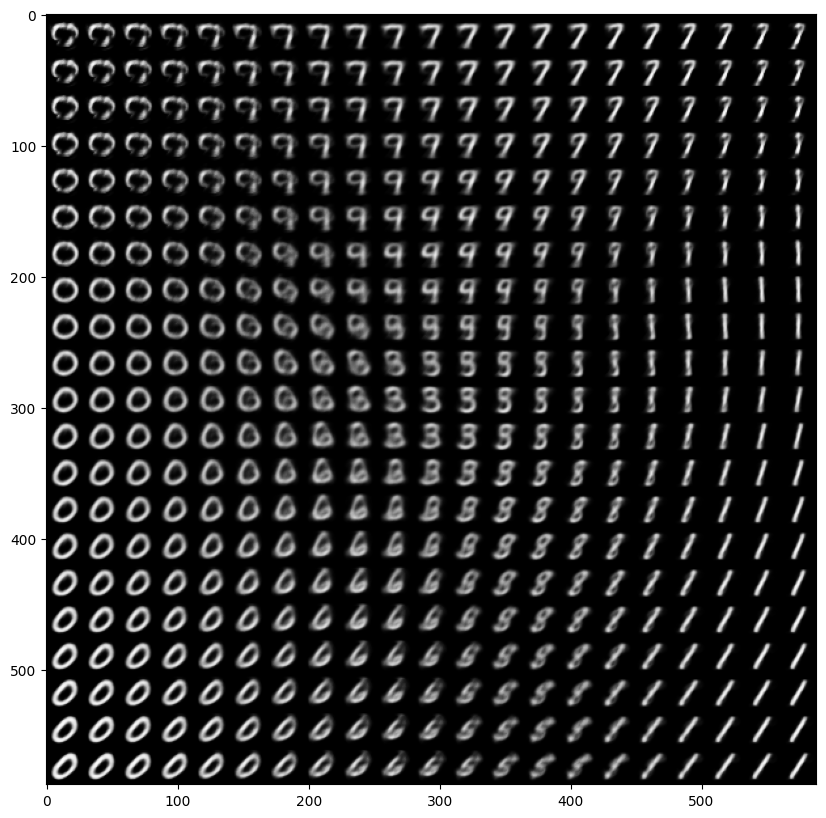

In [60]:
plt.figure(figsize=(10, 10))
plt.imshow(figure)
plt.show()

También podemos obtener las medias y desviaciones estándar que definen la bi-normal de una medición y samplear codificaciones / encodings con ellas. Esto generará imagenes similares pero no identicas y es muy útil para obtener datos sintéticos.

1/1 [==============================] - 0s 16ms/step


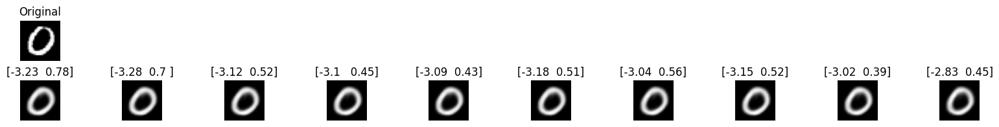

In [61]:
#elegimos número
number = 0
n_samples = 10

# Elijo una medición al azar de ese número.
i = np.arange(x_test.shape[0])
ind = y_test == number
i_number = i[ind]
np.random.shuffle(i_number)

fig = plt.figure(figsize=(2*n_samples, 2))
ax0 = fig.add_subplot(2, n_samples, 1)

plt.subplots_adjust(hspace=0.5)

plot_image(x_test[i_number][0])
ax0.set_title("Original")

for n_sample in range(n_samples):
    #sampleo
    zs = z_mean[i_number[0]] + np.sqrt(np.exp(z_var[i_number[0]])) * np.random.randn(2)
    #genero
    generated_im = variational_decoder.predict(zs.reshape(1,-1))
    #grafico
    ax = fig.add_subplot(2, n_samples, n_samples + n_sample + 1)
    plot_image(generated_im.squeeze())
    ax.set_title(str(np.round(zs, 2)))

plt.show()